In [1]:
import netCDF4 as nc
from metpy.plots import USCOUNTIES
import metpy
import cartopy.crs as ccrs 
import cartopy.feature as cfeature
import matplotlib.pyplot as plt
import numpy as np
import wrf
from wrf import vinterp, to_np, getvar, CoordPair, vertcross
import pandas as pd
import matplotlib.ticker as ticker
import os

C:\Users\Tony\anaconda3\lib\site-packages\paramiko\transport.py:219: CryptographyDeprecationWarning: Blowfish has been deprecated
  "class": algorithms.Blowfish,


In [6]:
def wrf_cross(ncfile):
    ncfile = nc.Dataset(ncfile)
    p = getvar(ncfile, "pressure")
    theta = getvar(ncfile, "theta", units="K")
    time = wrf.extract_times(ncfile, timeidx=0)
    time = pd.to_datetime(str(time))
    fig = plt.figure(figsize=(12,6), dpi=200.)
    ax = plt.axes()

    start_point = CoordPair(lat=45.5, lon=-91)
    end_point = CoordPair(lat=44, lon=-86)

    theta_cross = vertcross(theta, p, wrfin=ncfile, start_point=start_point,
                        end_point=end_point, latlon=False, meta=True)


    coord_pairs = to_np(theta_cross.coords["xy_loc"])

    theta_contours = ax.contourf(np.arange(coord_pairs.shape[0]),to_np(theta_cross["vertical"]),
                            to_np(theta_cross),np.arange(270.,370.,2.),cmap='coolwarm',
                            linestyles='dashed')
    plt.colorbar(theta_contours, ax=ax, label='Kelvins')
    theta_contours = ax.contour(np.arange(coord_pairs.shape[0]),to_np(theta_cross["vertical"]),
                            to_np(theta_cross),np.arange(270.,370.,2.),colors='black',
                            linestyles='dashed')
    plt.clabel(theta_contours, inline=1, fontsize=12, fmt="%i")

    #plt.clabel(theta_contours, inline=1, fontsize=12, fmt="%i")

    x_ticks = np.arange(coord_pairs.shape[0])
    x_labels = [pair.latlon_str(fmt="{:.2f}, {:.2f}")
                for pair in to_np(coord_pairs)]
    ax.set_xticks(x_ticks[::5])
    ax.set_xticklabels(x_labels[::5], rotation=45, fontsize=10)

    ax.set_yscale('symlog')
    #ax.yaxis.set_major_formatter(ScalarFormatter())
    ax.set_yticks(np.linspace(100, 1000, 10))
    ax.set_ylim(1000, 500)
    formatter = ticker.FuncFormatter(lambda x, pos: '{:.0f}'.format(x))
    ax.yaxis.set_major_formatter(formatter)
    ax.grid(axis='y', linestyle='--', linewidth=0.5, color='black')

    # Set the x-axis and  y-axis labels
    ax.set_xlabel("Latitude/Longitude", fontsize=12)
    ax.set_ylabel("Pressure (hPa)", fontsize=12)
    plt.title("WRF Cross-Section Potential Temperature Between \n (45.5, 91) and (44.5, 86) at {} UTC".format(time.strftime("%Y-%m-%d %H:%M")))
    plt.savefig("METR_4990_WRF_Potential_Temperature_Cross_Section_{}".format(time.strftime("%Y-%m-%d-%H_%M")), dpi=200.)
    plt.show()

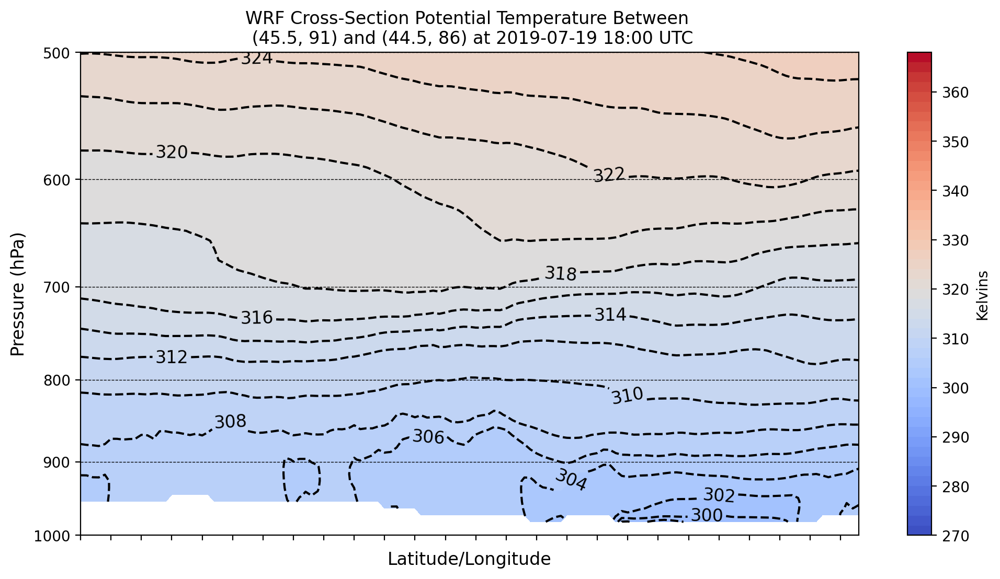

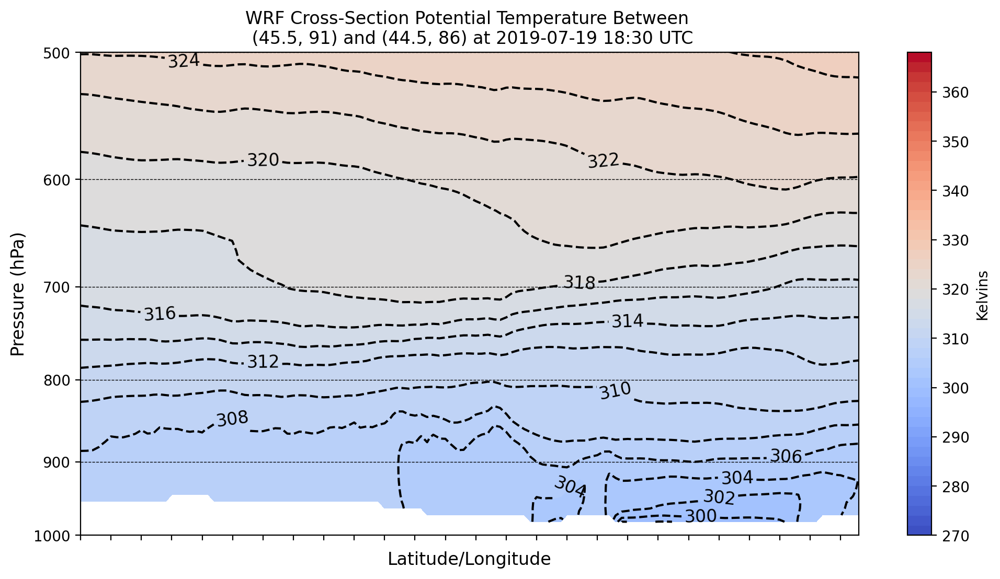

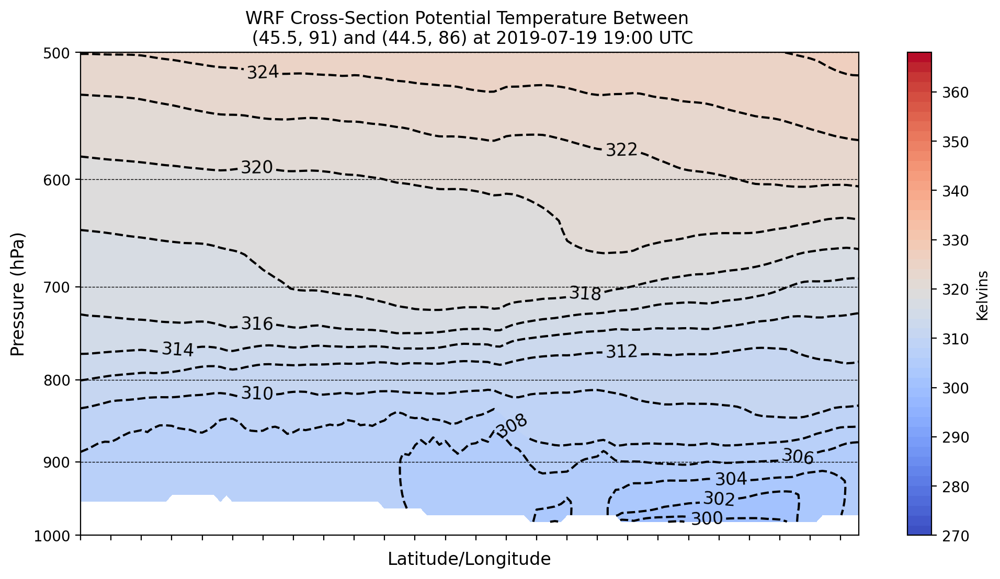

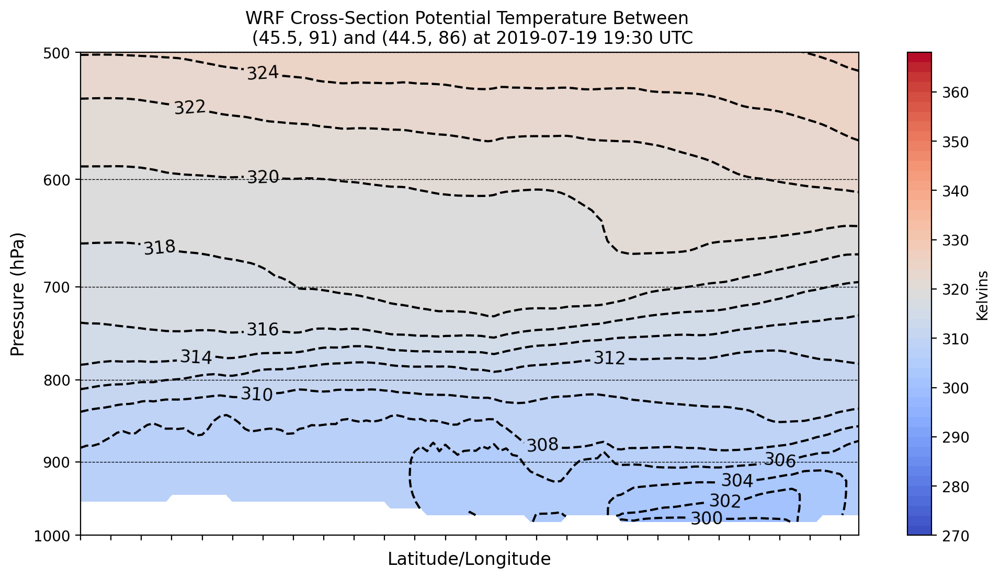

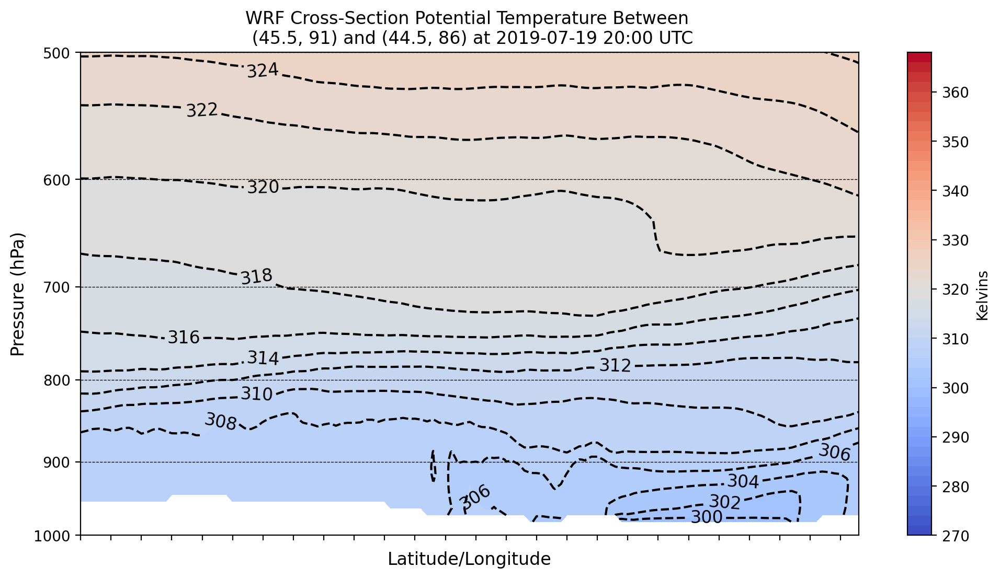

...

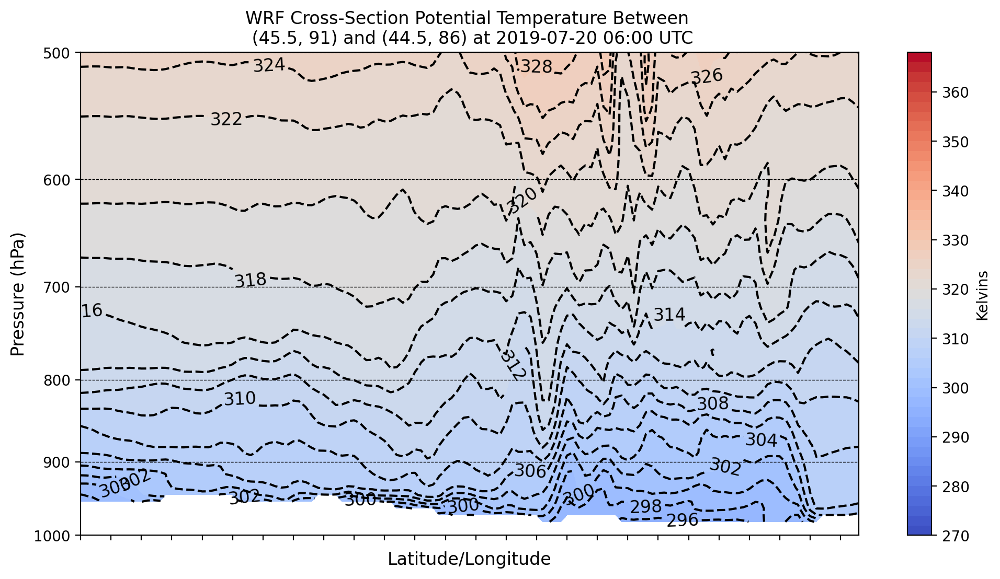

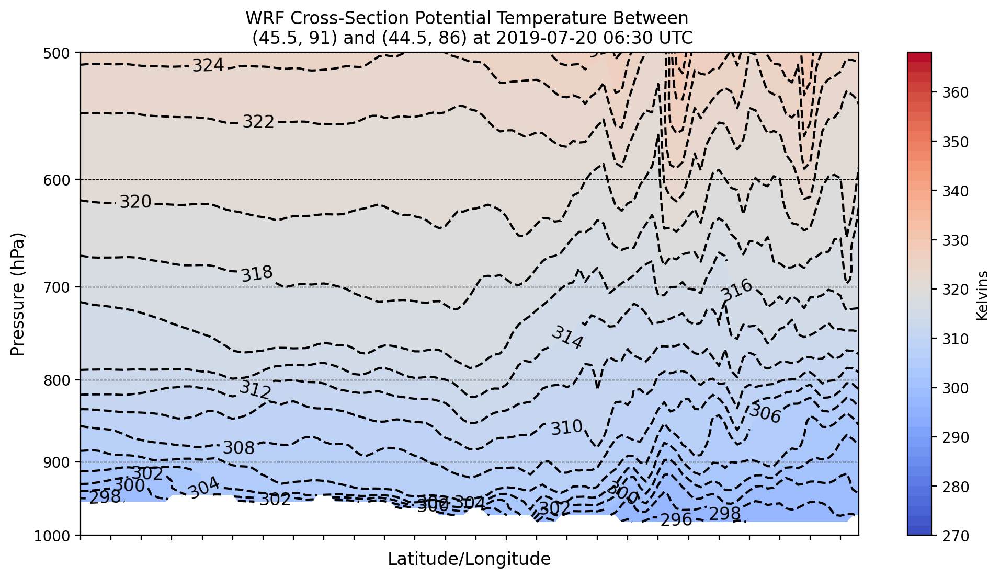

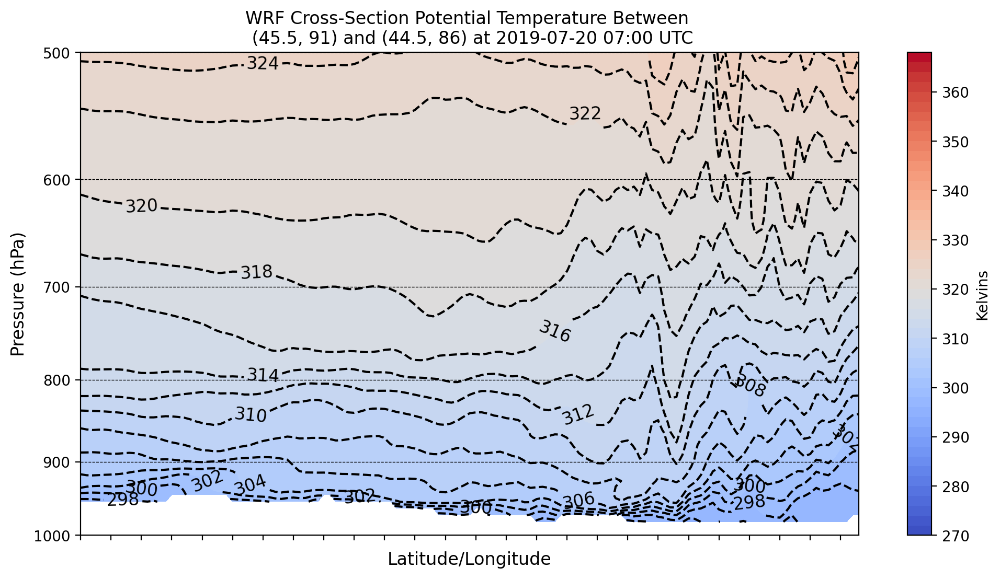

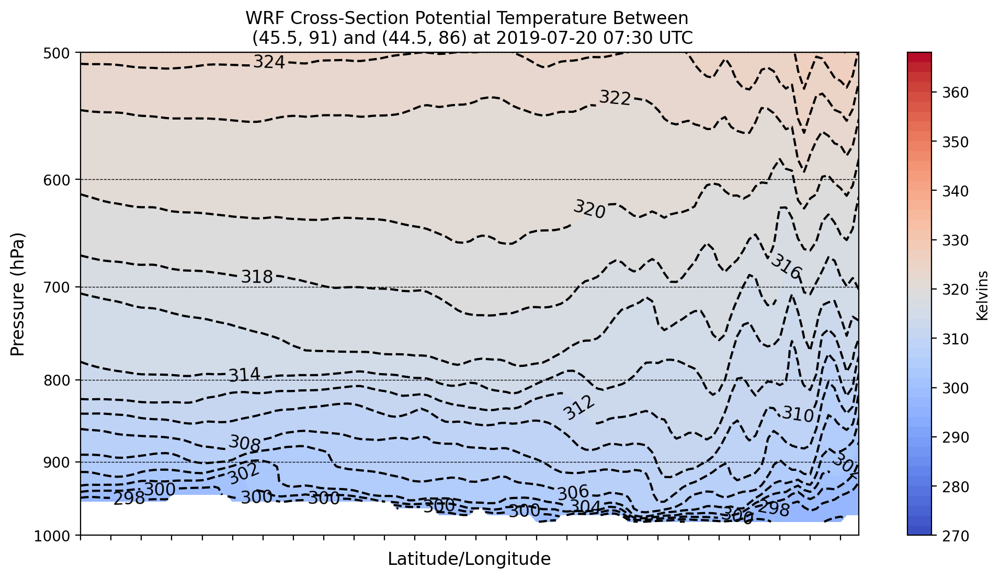

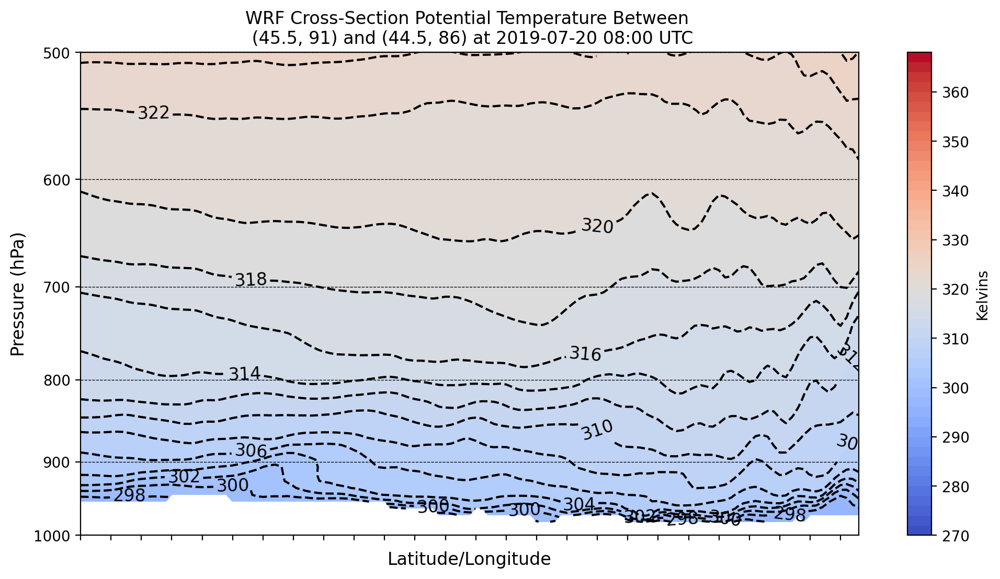

In [7]:
directory = 'c:\\Users\\Tony\\Desktop\\METR 4990\\newwrf'
for filename in os.listdir(directory):
    file_path = os.path.join(directory, filename)
    wrf_cross(file_path)